In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import numpy as np
import pandas as pd
import anndata as ad
from scipy import sparse
import cell2location

f:\anaconda\envs\scvi-env\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
f:\anaconda\envs\scvi-env\lib\site-packages\torchaudio\backend\utils.py:74: UserWarning: No audio backend is available.
  warnings.warn("No audio backend is available.")
f:\anaconda\envs\scvi-env\lib\site-packages\scvi\_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
f:\anaconda\envs\scvi-env\lib\site-packages\scvi\_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
f:\anaconda\envs\scvi-env\lib\site-packages\umap\distances.py:1063: NumbaDeprecat

In [4]:
samples_dict = {"CTR": "CTR", "AAV": "AAV"}

In [3]:
sc.settings.verbosity = 3  
# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white', frameon=True, figsize=(5, 5))

In [13]:
ovary_adata_sc = sc.read_h5ad("Integrate/scRNA_ref.h5ad")
ovary_adata_sc

AnnData object with n_obs × n_vars = 27996 × 23657
    obs: 'nGene', 'nUMI', 'fraction.mito', 'condition', 'dominant_index', 'percent_dominant', 'Level0', 'doubletSimScore', 'mouse', 'Level1', 'Level2', 'nCount_RNA', 'nFeature_RNA', 'aucs', 'group', 'RNA_snn_res.0.45', 'seurat_clusters', 'RNA_snn_res.0.2', 'RNA_snn_res.0.4', 'Myeloid_subtype'
    var: 'name'

f:\anaconda\envs\scvi-env\lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


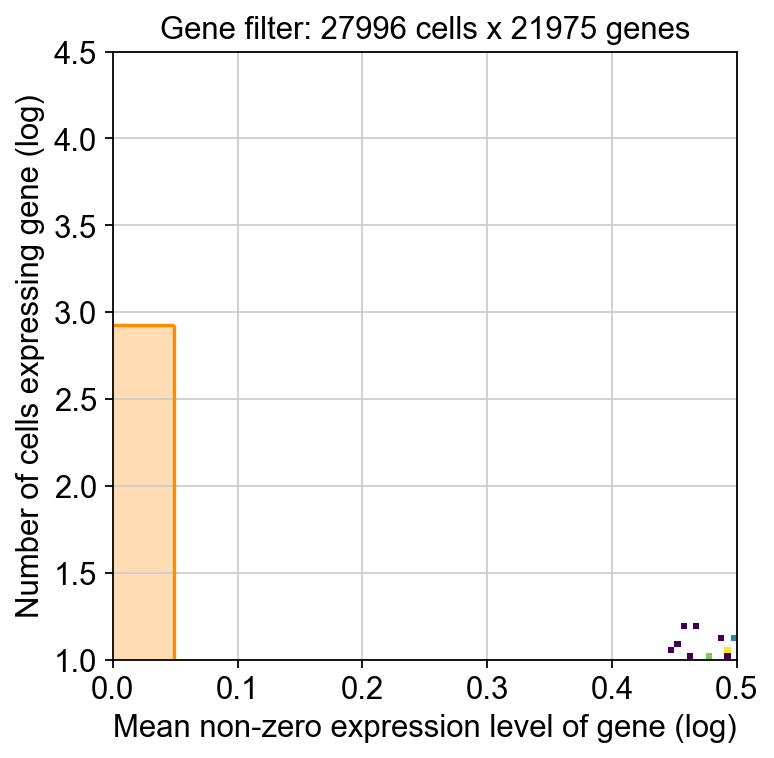

In [14]:
from cell2location.utils.filtering import filter_genes
selected = filter_genes(ovary_adata_sc, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12)
# %notebook filter the object
ovary_adata_sc = ovary_adata_sc[:, selected].copy()

In [15]:
# prepare anndata for the regression model
import cell2location
cell2location.models.RegressionModel.setup_anndata(adata=ovary_adata_sc,
                        # 10X reaction / sample / batch
                        batch_key='mouse',
                        # cell type, covariate used for constructing signatures
                        labels_key='Level1')

f:\anaconda\envs\scvi-env\lib\site-packages\scvi\data\fields\_layer_field.py:101: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  _verify_and_correct_data_format(adata, self.attr_name, self.attr_key)


In [16]:
from cell2location.models import RegressionModel
mod = RegressionModel(ovary_adata_sc)

# view anndata_setup as a sanity check
mod.view_anndata_setup()

Anndata setup with scvi-tools version 1.0.3.

Setup via `RegressionModel.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'mouse',
│   'labels_key': 'Level1',
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │  16   │
│         n_cells          │ 27996 │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │  24   │
│          n_vars          │ 21975 │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                  batch State Registry                   
┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃  Source Location   ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['mouse'] │     1A     │          0          │
│                    │     1B     │          1          │
│                    │     1C     │          2          │
│                    │     1D     │          3          │
│                    │     1E     │          4          │
│                    │     2A     │          5          │
│                    │     2B     │          6          │
│                    │     2C     │          7          │
│                    │     3A     │          8          │
│                    │     3B     │          9          │
│                    │     3E     │         10          │
│                    │     4B     │         11          │
│                    │     4D     │         12          │
│                    │     4E     │         13          │
│                    │     5A     │         14          │
│                    │     5C     │         15          │
└────────────────────┴────────────┴─────────────────────┘

                        labels State Registry                        
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃      Categories       ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['Level1'] │       EN_Blood        │          0          │
│                     │       EN_Lymph        │          1          │
│                     │      Epithelium       │          2          │
│                     │       GC_Antral       │          3          │
│                     │      GC_Atretic       │          4          │
│                     │     GC_CL_Active      │          5          │
│                     │      GC_CL_Lytic      │          6          │
│                     │      GC_Estrous       │          7          │
│                     │      GC_Mitotic       │          8          │
│                     │       GC_Mural        │          9          │
│                     │     GC_Preantral      │         10          │
│                     │       I_B_Cell        │         11          │
│                     │   I_Dendritic_Cell    │         12          │
│                     │     I_Granulocyte     │         13          │
│                     │     I_Macrophage      │         14          │
│                     │       I_T_Cell        │         15          │
│                     │   M_Cortical Stroma   │         16          │
│                     │ M_Dividing Mesenchyme │         17          │
│                     │   M_Immature Theca    │         18          │
│                     │  M_Medullary Stroma   │         19          │
│                     │      M_Pericyte       │         20          │
│                     │    M_Smooth Muscle    │         21          │
│                     │ M_Steroidogenic Theca │         22          │
│                     │        Oocyte         │         23          │
└─────────────────────┴───────────────────────┴─────────────────────┘

In [17]:
mod.train(max_epochs=250)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
f:\anaconda\envs\scvi-env\lib\site-packages\lightning\pytorch\trainer\configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
You are using a CUDA device ('NVIDIA GeForce RTX 3080') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 250/250: 100%|██████████| 250/250 [19:35<00:00,  4.67s/it, v_num=1, elbo_train=2.26e+8]

`Trainer.fit` stopped: `max_epochs=250` reached.


Epoch 250/250: 100%|██████████| 250/250 [19:35<00:00,  4.70s/it, v_num=1, elbo_train=2.26e+8]


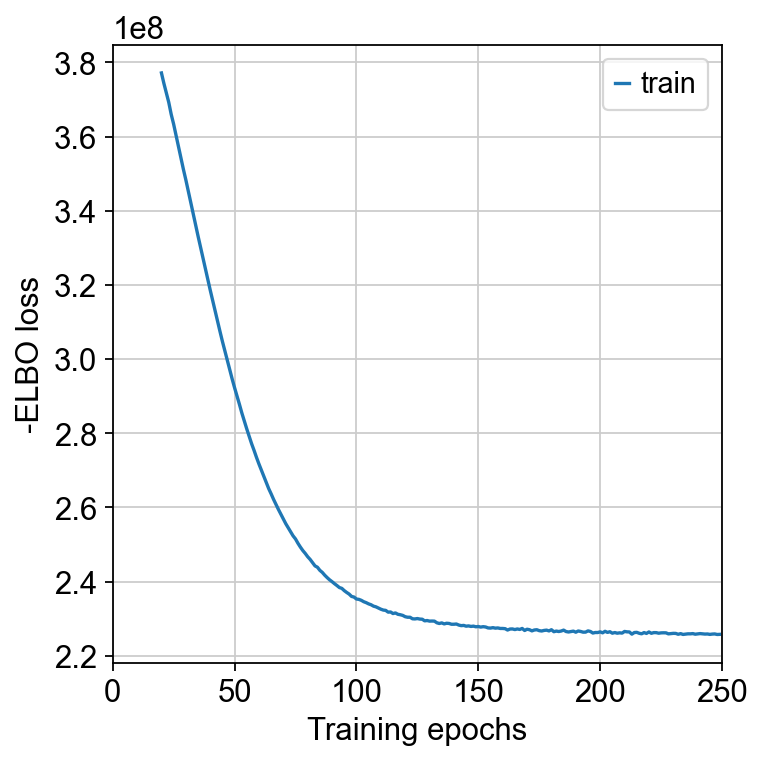

In [18]:
mod.plot_history(20)

In [19]:
# In this section, we export the estimated cell abundance (summary of the posterior distribution).
ovary_adata_sc = mod.export_posterior(
    ovary_adata_sc, sample_kwargs={'num_samples': 1000, 'batch_size': 2500, 'use_gpu': True}
)

# Save model
mod.save("./pyobjs/ovary_cell2location_sc_ref_mod_level1", overwrite=True)

# Save anndata object with results
ovary_adata_sc.write("./pyobjs/ovary_cell2location_sc_ref_Level1.h5ad")

f:\anaconda\envs\scvi-env\lib\site-packages\scvi\model\base\_pyromixin.py:388: UserWarning: `use_gpu` is deprecated in v1.0 and will be removed in v1.1. Please use `accelerator` and `devices` instead.
  _, _, device = parse_device_args(


Sampling global variables, sample: 100%|██████████| 999/999 [00:13<00:00, 72.17it/s]


In [4]:
adata_ref = sc.read_h5ad("./pyobjs/ovary_cell2location_sc_ref_Level1.h5ad")
mod = cell2location.models.RegressionModel.load(f"./pyobjs/ovary_cell2location_sc_ref_mod_level1", adata_ref, use_gpu = True)

INFO     File ./pyobjs/ovary_cell2location_sc_ref_mod_level1\model.pt already downloaded                           


f:\anaconda\envs\scvi-env\lib\site-packages\scvi\model\base\_base_model.py:676: UserWarning: `use_gpu` is deprecated in v1.0 and will be removed in v1.1. Please use `accelerator` and `devices` instead.
  _, _, device = parse_device_args(
No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
f:\anaconda\envs\scvi-env\lib\site-packages\scvi\data\fields\_layer_field.py:101: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  _verify_and_correct_data_format(adata, self.attr_name, self.attr_key)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
f:\anaconda\envs\scvi-env\lib\site-packages\lightning\pytorch\trainer\configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_da

Epoch 1/714:   0%|          | 1/714 [00:01<22:12,  1.87s/it, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/714:   0%|          | 1/714 [00:01<22:22,  1.88s/it, v_num=1]


In [5]:
# export estimated expression in each cluster
if 'means_per_cluster_mu_fg' in adata_ref.varm.keys():
    inf_aver = adata_ref.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
else:
    inf_aver = adata_ref.var[[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
inf_aver.columns = adata_ref.uns['mod']['factor_names']
print(inf_aver.shape)
inf_aver.iloc[0:5, 0:5]

(21975, 24)


,EN_Blood,EN_Lymph,Epithelium,GC_Antral,GC_Atretic
X0610006L08Rik,0.000979,0.011044,0.003495,0.000584,0.004163
X0610007P14Rik,0.422161,0.605924,0.771363,0.648124,0.451164
X0610009B22Rik,0.371407,0.459827,0.830222,0.770080,0.506952
X0610009E02Rik,0.005083,0.029111,0.047585,0.022734,0.023258
X0610009L18Rik,0.072772,0.020620,0.255861,0.211619,0.213749


In [6]:
adata_vis = sc.read_h5ad("./Integrate/adata_ovary_combined_raw_count.h5ad")
adata_vis = adata_vis[sc.read_h5ad("./Integrate/adata_ovary_combined_processed0.h5ad").obs_names]
adata_vis

View of AnnData object with n_obs × n_vars = 303411 × 19059
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'Sample'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts-AAV', 'mean_counts-AAV', 'log1p_mean_counts-AAV', 'pct_dropout_by_counts-AAV', 'total_counts-AAV', 'log1p_total_counts-AAV', 'n_cells_by_counts-CTR', 'mean_counts-CTR', 'log1p_mean_counts-CTR', 'pct_dropout_by_counts-CTR', 'total_counts-CTR', 'log1p_total_counts-CTR'
    obsm: 'spatial'

In [7]:
# find shared genes and subset both anndata and reference signatures
intersect = np.intersect1d(adata_vis.var_names, inf_aver.index)
print(len(intersect))
adata_vis = adata_vis[:, intersect].copy()
inf_aver = inf_aver.loc[intersect, :].copy()

# prepare anndata for cell2location model
cell2location.models.Cell2location.setup_anndata(adata=adata_vis, batch_key="Sample")

16455


In [8]:
# create and train the model
mod = cell2location.models.Cell2location(
    adata_vis, cell_state_df=inf_aver,
    # the expected average cell abundance: tissue-dependent
    # hyper-prior which can be estimated from paired histology:
    N_cells_per_location=1,
    # hyperparameter controlling normalisation of
    # within-experiment variation in RNA detection:
    detection_alpha=20
)
mod.view_anndata_setup()

Anndata setup with scvi-tools version 1.0.3.

Setup via `Cell2location.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'Sample',
│   'labels_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics          
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃     Summary Stat Key     ┃ Value  ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│         n_batch          │   2    │
│         n_cells          │ 303411 │
│ n_extra_categorical_covs │   0    │
│ n_extra_continuous_covs  │   0    │
│         n_labels         │   1    │
│          n_vars          │ 16455  │
└──────────────────────────┴────────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                   batch State Registry                   
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['Sample'] │    CTR     │          0          │
│                     │    AAV     │          1          │
└─────────────────────┴────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

In [9]:
mod.train(max_epochs=300,
          # train using full data (batch_size=None)
          batch_size=2500,
          # use all data points in training because
          # we need to estimate cell abundance at all locations
          train_size= 1.0)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
f:\anaconda\envs\scvi-env\lib\site-packages\lightning\pytorch\trainer\configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 300/300: 100%|██████████| 300/300 [2:34:15<00:00, 30.50s/it, v_num=1, elbo_train=9.15e+8]  

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 300/300: 100%|██████████| 300/300 [2:34:15<00:00, 30.85s/it, v_num=1, elbo_train=9.15e+8]


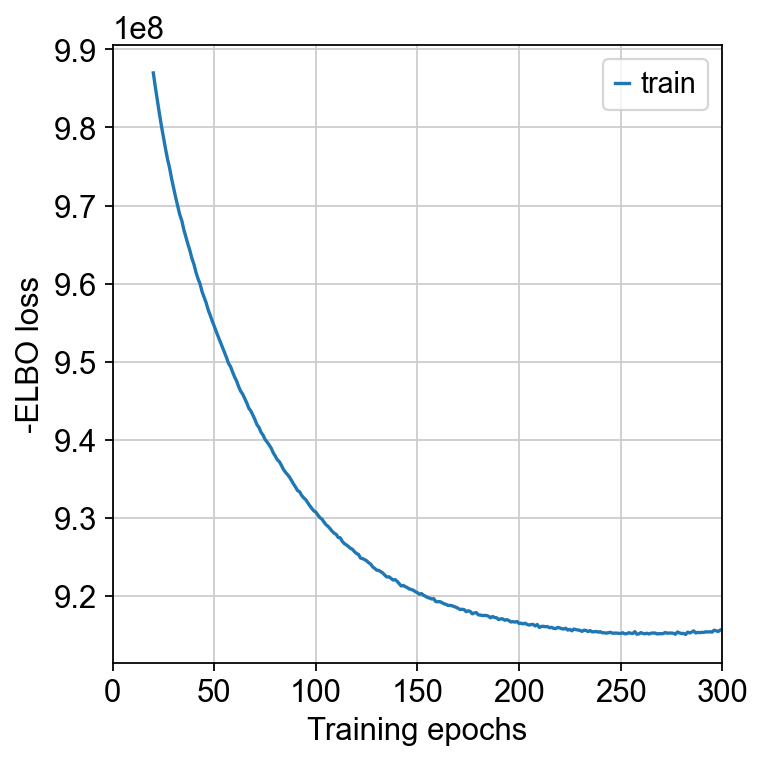

In [10]:
mod.plot_history(20)

In [11]:
# Save model
mod.save("./pyobjs/ovary_cell2location_ss_combined_mod_level1", overwrite=True)

# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_vis = mod.export_posterior(
    adata_vis, sample_kwargs={'num_samples': 500, 'batch_size': 2500, 'use_gpu': True}
)

# Save anndata object with results
adata_vis.write("./pyobjs/ovary_cell2location_ss_combined_Level1.h5ad")

f:\anaconda\envs\scvi-env\lib\site-packages\scvi\model\base\_pyromixin.py:388: UserWarning: `use_gpu` is deprecated in v1.0 and will be removed in v1.1. Please use `accelerator` and `devices` instead.
  _, _, device = parse_device_args(


Sampling global variables, sample: 100%|██████████| 499/499 [00:14<00:00, 35.58it/s]


If you can train the model on full data, I would strongly recommend continuing to do so, but instead replacing the mod.export_posterior with a more memory-efficient alternative by computing the quantiles directly rather than using 1000 samples (default):

In [ ]:
# adata_vis = mod.export_posterior(
#     adata_vis, use_quantiles=True,
#     # choose quantiles
#     add_to_obsm=["q05","q50", "q95", "q0001"],
#     sample_kwargs={'batch_size': 2500, 'use_gpu': True}
# )

In [11]:
# Save anndata object with results
# adata_vis.write("./pyobjs/ovary_cell2location_ss_combined_Level1.h5ad")

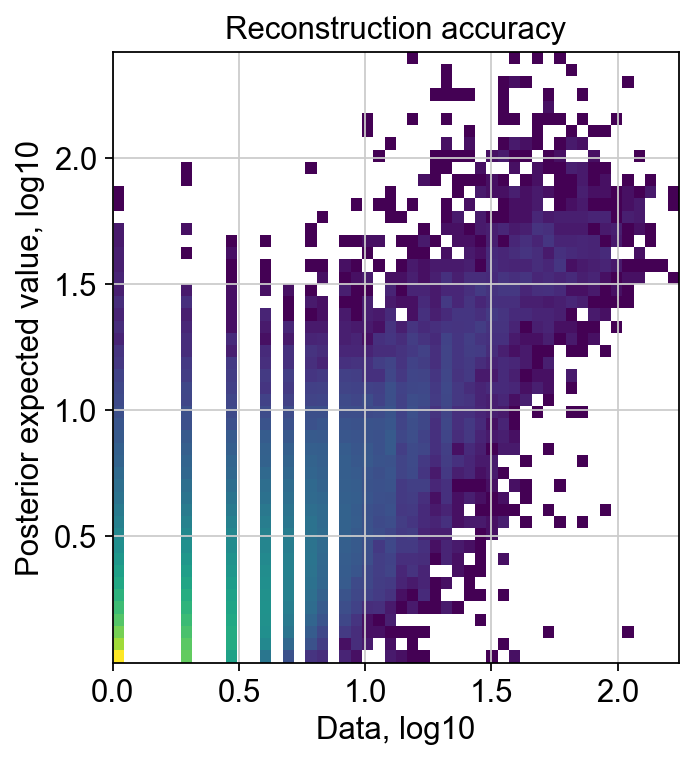

In [12]:
# # note that you would also have to specify mod.plot_QC(summary_name= 'q50') instead of mod.plot_QC(summary_name= 'means') (default).
# mod.plot_QC(summary_name= 'q50')
mod.plot_QC()

In [2]:
adata_vis = sc.read_h5ad("./pyobjs/ovary_cell2location_ss_combined_level1.h5ad")
adata_vis

AnnData object with n_obs × n_vars = 303411 × 16455
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'Sample', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts-AAV', 'mean_counts-AAV', 'log1p_mean_counts-AAV', 'pct_dropout_by_counts-AAV', 'total_counts-AAV', 'log1p_total_counts-AAV', 'n_cells_by_counts-CTR', 'mean_counts-CTR', 'log1p_mean_counts-CTR', 'pct_dropout_by_counts-CTR', 'total_counts-CTR', 'log1p_total_counts-CTR'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [7]:
# mod = cell2location.models.Cell2location.load(f"./pyobjs/ovary_cell2location_ss_combined_mod_level1", adata_vis, )

In [3]:
print(adata_vis.obsm)
adata_vis.obsm['q05_cell_proportions'] = adata_vis.obsm['q05_cell_abundance_w_sf'].div(adata_vis.obsm['q05_cell_abundance_w_sf'].sum(axis=1), axis=0)
# add 5% quantile, representing confident cell abundance, 'at least this amount is present',
# to adata.obs with nice names for plotting
adata_vis.obs["total_abundance"] = adata_vis.obsm['q05_cell_abundance_w_sf'].sum(axis = 1)
adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q05_cell_proportions']
ct_list = list(adata_vis.uns['mod']['factor_names'])
ct_list = ["Level1_" + x for x in ct_list]
# for ct in ct_list:
#     data = adata_vis.obs[ct].values
#     adata_vis.obs[ct] = np.clip(data,0, np.quantile(data, 0.90))
adata_vis.obs["Level1_" + "max_pred"] = adata_vis.obs[adata_vis.uns['mod']['factor_names']].max(axis=1)
adata_vis.obs["Level1_" + "max_pred_celltype"] = adata_vis.obs[adata_vis.uns['mod']['factor_names']].idxmax(axis=1)

AxisArrays with keys: means_cell_abundance_w_sf, q05_cell_abundance_w_sf, q95_cell_abundance_w_sf, spatial, stds_cell_abundance_w_sf


In [4]:
# Save anndata object with results
# adata_vis.write_h5ad("./pyobjs/slideseq_cell2loc_level1.h5ad")

In [5]:
adata_vis = sc.read_h5ad("./pyobjs/slideseq_cell2loc_RCTD_level1.h5ad")
adata_vis

AnnData object with n_obs × n_vars = 303411 × 16455
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'Sample', '_indices', '_scvi_batch', '_scvi_labels', 'total_abundance', 'EN_Blood', 'EN_Lymph', 'Epithelium', 'GC_Antral', 'GC_Atretic', 'GC_CL_Active', 'GC_CL_Lytic', 'GC_Estrous', 'GC_Mitotic', 'GC_Mural', 'GC_Preantral', 'I_B_Cell', 'I_Dendritic_Cell', 'I_Granulocyte', 'I_Macrophage', 'I_T_Cell', 'M_Cortical Stroma', 'M_Dividing Mesenchyme', 'M_Immature Theca', 'M_Medullary Stroma', 'M_Pericyte', 'M_Smooth Muscle', 'M_Steroidogenic Theca', 'Oocyte', 'Level1_max_pred', 'Level1_max_pred_celltype'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts-AAV', 'mean_counts-AAV', 'log1p_mean_counts-AAV', 'pct_dropout_by_counts-AAV', 'total_counts-AAV', 'log1p_total_counts-AA

In [4]:
print(adata_vis.obs["Level1_max_pred_celltype"].value_counts())

M_Steroidogenic Theca    55770
GC_CL_Lytic              52082
EN_Blood                 36357
GC_Antral                30180
M_Smooth Muscle          23452
I_Macrophage             17832
GC_Mitotic               17406
M_Medullary Stroma       12089
Epithelium                9721
M_Pericyte                8877
EN_Lymph                  6375
GC_Preantral              6125
GC_Atretic                5530
M_Cortical Stroma         4699
M_Dividing Mesenchyme     4282
GC_Estrous                3511
M_Immature Theca          3154
Oocyte                    2918
I_T_Cell                  1035
GC_CL_Active               900
I_Dendritic_Cell           591
I_Granulocyte              319
I_B_Cell                   195
GC_Mural                    11
Name: Level1_max_pred_celltype, dtype: int64


In [6]:
import pandas as pd

# 重新分类函数
def categorize(celltype):
    if celltype.startswith('I_'):
        return 'Immune'
    elif celltype.startswith('GC_CL_'):
        return 'GC_Lytic'
    elif celltype.startswith('EN_'):
        return 'Endothelium'
    elif celltype == 'GC_Estrous':
        return 'remove'
    else:
        return celltype

# 应用分类函数
adata_vis.obs['group'] = adata_vis.obs['Level1_max_pred_celltype'].apply(categorize)

# 移除分类为 'remove' 的行
adata_vis = adata_vis[adata_vis.obs['group'] != 'remove']


In [7]:
print(adata_vis.obs["group"].value_counts())

M_Steroidogenic Theca    55770
GC_Lytic                 52982
Endothelium              42732
GC_Antral                30180
M_Smooth Muscle          23452
Immune                   19972
GC_Mitotic               17406
M_Medullary Stroma       12089
Epithelium                9721
M_Pericyte                8877
GC_Preantral              6125
GC_Atretic                5530
M_Cortical Stroma         4699
M_Dividing Mesenchyme     4282
M_Immature Theca          3154
Oocyte                    2918
GC_Mural                    11
Name: group, dtype: int64


In [6]:
# import scanpy as sc
# import matplotlib.pyplot as plt

# # 设置绘图参数
# sc.settings.set_figure_params(dpi_save=400, fontsize=6, figsize=(3.0, 3.0), facecolor='white', frameon=False, transparent=True, vector_friendly=True, format="pdf")

# # 循环绘制每个样本的空间图
# for sample in samples_dict.keys():
#     # 创建新的绘图
#     sc.pl.spatial(adata_vis[adata_vis.obs["Sample"] == sample], cmap="Blues",
#                   color=list(adata_vis.obs["Level1_max_pred_celltype"].value_counts().index), spot_size=30, 
#                   ncols=6, wspace=0.2, hspace=0.2, vmin=0, vmax='p99.2', legend_fontsize=5, show=False)
    
#     # 保存图形为 PDF 文件
#     plt.savefig(f"figures/spatial_plot_{sample}_level1.pdf", format='pdf')

#     # 关闭图形以节省内存
#     plt.close()


In [7]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import rgb2hex

# 假设你已有一个‘adata’对象并已经进行了基础处理，如聚类等
# 将 'group' 列转换为 category 类型
adata_vis.obs['group'] = adata_vis.obs['group'].astype('category')
# 获取annotation类别
annotation_categories = adata_vis.obs['group'].cat.categories

# 选择一个颜色调色板
palette = sns.color_palette("Paired", len(annotation_categories))

# Convert the palette to hex color codes using matplotlib's rgb2hex
colors = [rgb2hex(color) for color in palette]

# 添加颜色信息到adata.uns中
adata_vis.uns['group_colors'] = colors

C:\Users\zyy\AppData\Local\Temp\ipykernel_27004\3011038706.py:8: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_vis.obs['group'] = adata_vis.obs['group'].astype('category')


In [8]:
colors = ['#e31a1c', # Endothelium
            '#DFA0A6', # Epithelium
            '#CB6B7A', # antral
            '#cb8e85', # atretic
            # '#fb9a99', # Lytic
            '#f15536',
            '#fdbf6f',
            '#ff7f00',
            '#EDBAA7',
            '#FFA500', # immune
            '#C0C0C0',# M
            
            '#8A2BE2',
            '#A0C2e7', 
            '#98b3d9',
            
            '#6495ED',
            
            '#F8F8FF',
            '#D5CBDA',
            '#ae716e'] # oocyte
# 添加颜色信息到adata.uns中
adata_vis.uns['group_colors'] = colors

[<Axes: title={'center': 'ctr'}, xlabel='spatial1', ylabel='spatial2'>]

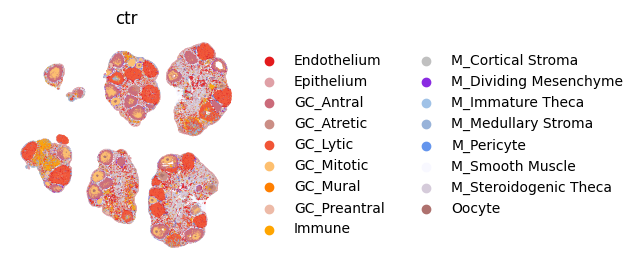

In [9]:
# 创建一个仅用于保存图例的图形
fig, ax = plt.subplots(figsize=(3, 6))  # 这里定义图例保存图形尺寸


subset = adata_vis[adata_vis.obs["Sample"] == 'CTR']

sc.pl.spatial(subset, color=['group'], 
                wspace=0.0, hspace=0.0, spot_size=30, 
                frameon=False, title="ctr", show=False, ax=ax)


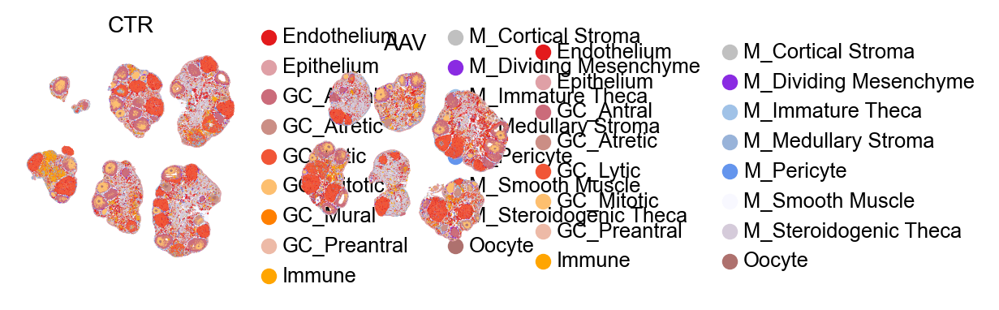

In [11]:
fig, axs = plt.subplots(1,2, figsize = (4,2))
for i, sample in enumerate(samples_dict.keys()):
    sc.settings.set_figure_params(dpi=100, dpi_save= 100, 
                                  fontsize=10, facecolor='white', 
                                  frameon=False, figsize=(2.0, 2.0), 
                                  vector_friendly = False, transparent=True, format="pdf")
    sc.pl.spatial(adata_vis[adata_vis.obs["Sample"] == sample], 
                  color = ["group"], 
                  wspace= 1.0, 
                  spot_size = 30, 
                  frameon=False, title=sample, show=False, ax=axs[i]) 

In [28]:
import scanpy as sc
import matplotlib.pyplot as plt

# 设置图形参数
sc.settings.set_figure_params(dpi=100, 
                              dpi_save=100, 
                              fontsize=10, 
                              facecolor='white', 
                              frameon=False, figsize=(12, 6),
                              vector_friendly=False, transparent=True, format="pdf")

grouping_var = "group"
samples = list(samples_dict.keys())
fig, axs = plt.subplots(1, len(samples), figsize=(len(samples) * 4, 8))

handles, labels = None, None  # 初始化图例变量

for i, sample in enumerate(samples):
    subset = adata_vis[adata_vis.obs["Sample"] == sample]
    ax = axs[i]
    sc.pl.spatial(subset, color=[grouping_var], 
                  wspace=0.0, hspace=0.0, spot_size=30, 
                  frameon=False, title=sample, show=False, ax=ax, legend_loc=None)
    if handles is None and labels is None:  # 保存第一个子图的图例信息
        handles, labels = ax.get_legend_handles_labels()

# 仅在 handles 和 labels 不为 None 时添加全局图例
if handles and labels:
    # 使用子图外部的图例
    fig.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5), frameon=False)

plt.subplots_adjust(wspace=0, hspace=0)

# 保存图像为 PDF 文件
plt.savefig("figures/spatial_plot_level1_total.pdf", format='pdf', bbox_inches='tight')

# 关闭图形以节省内存
plt.close()


In [29]:
import matplotlib.pyplot as plt

# # 假设 handles 和 labels 从之前的图例中获取
# # 示例 handles 和 labels
# handles = [plt.Line2D([0], [0], color='red', lw=4, label='Label 1'),
#            plt.Line2D([0], [0], color='blue', lw=4, label='Label 2')]
# labels = ['Red Label', 'Blue Label']

# 创建一个仅用于保存图例的图形
fig, ax = plt.subplots(figsize=(2, 6))  # 这里定义图例保存图形尺寸


subset = adata_vis[adata_vis.obs["Sample"] == 'CTR']

sc.pl.spatial(subset, color=[grouping_var], 
                wspace=0.0, hspace=0.0, spot_size=30, 
                frameon=False, title=sample, show=False, ax=ax, cmap="RdPu")




# 保存图像为 PDF 文件
plt.savefig("figures/spatial_plot_level1_legend.pdf", format='pdf', bbox_inches='tight')

# 关闭图形以节省内存
plt.close()



In [8]:
import pandas as pd

# 重新分类函数
def categorize(celltype):
    if celltype == 'M_Steroidogenic Theca':
        return 'M_Steroidogenic_stromal'
    elif celltype == "M_Smooth Muscle":
        return 'M_Smooth_Muscle'
    elif celltype == "M_Medullary Stroma":
        return 'M_Fibroblast-like_cells'
    elif celltype == 'M_Pericyte':
        return 'M_Pericyte'
    elif celltype == 'M_Cortical Stroma':
        return 'M_Fibroblast-like_cells'
    elif celltype == 'M_Dividing Mesenchyme':
        return 'M_Dividing_Mesenchyme'
    elif celltype == 'M_Immature Theca':
        return 'M_Dividing_Mesenchyme'
    else:
        return celltype

# 应用分类函数
adata_vis.obs['annotation'] = adata_vis.obs['group'].apply(categorize)

C:\Users\zyy\AppData\Local\Temp\ipykernel_27460\3404431057.py:23: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_vis.obs['annotation'] = adata_vis.obs['group'].apply(categorize)


In [9]:
colors = ['#e31a1c', # Endothelium
            '#DFA0A6', # Epithelium
            '#CB6B7A', # antral
            '#cb8e85', # atretic
            # '#fb9a99', # Lytic
            '#f15536',
            '#fdbf6f',
            '#ff7f00',
            '#EDBAA7',
            '#FFA500', # immune
            '#C0C0C0',# M
            
            '#8A2BE2',
            '#A0C2e7', 
            # '#98b3d9',
            
            # '#6495ED',
            
            '#F8F8FF',
            '#D5CBDA',
            '#ae716e'] # oocyte
# 添加颜色信息到adata.uns中
adata_vis.uns['annotation_colors'] = colors

f:\anaconda\envs\scvi-env\lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
f:\anaconda\envs\scvi-env\lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


[<Axes: title={'center': 'ctr'}, xlabel='spatial1', ylabel='spatial2'>]

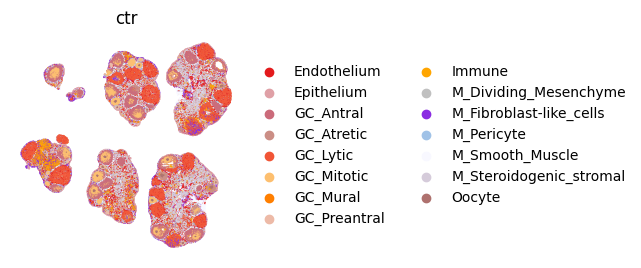

In [10]:
# 创建一个仅用于保存图例的图形
fig, ax = plt.subplots(figsize=(3, 6))  # 这里定义图例保存图形尺寸


subset = adata_vis[adata_vis.obs["Sample"] == 'CTR']

sc.pl.spatial(subset, color=['annotation'], 
                wspace=0.0, hspace=0.0, spot_size=30, 
                frameon=False, title="ctr", show=False, ax=ax)

In [11]:
adata_vis.write_h5ad("Integrate/adata_vis_level0_annotation.h5ad")

In [12]:
import scanpy as sc
import matplotlib.pyplot as plt

# 设置图形参数
sc.settings.set_figure_params(dpi=100, 
                              dpi_save=100, 
                              fontsize=10, 
                              facecolor='white', 
                              frameon=False, figsize=(12, 6),
                              vector_friendly=False, transparent=True, format="pdf")

grouping_var = "annotation"
samples = list(samples_dict.keys())
fig, axs = plt.subplots(1, len(samples), figsize=(len(samples) * 4, 8))

handles, labels = None, None  # 初始化图例变量

for i, sample in enumerate(samples):
    subset = adata_vis[adata_vis.obs["Sample"] == sample]
    ax = axs[i]
    sc.pl.spatial(subset, color=[grouping_var], 
                  wspace=0.0, hspace=0.0, spot_size=30, 
                  frameon=False, title=sample, show=False, ax=ax, legend_loc=None)
    if handles is None and labels is None:  # 保存第一个子图的图例信息
        handles, labels = ax.get_legend_handles_labels()

# 仅在 handles 和 labels 不为 None 时添加全局图例
if handles and labels:
    # 使用子图外部的图例
    fig.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5), frameon=False)

plt.subplots_adjust(wspace=0, hspace=0)

# 保存图像为 PDF 文件
plt.savefig("figures/spatial_plot_level1_total_annotation.pdf", format='pdf', bbox_inches='tight')

# 关闭图形以节省内存
plt.close()


In [13]:
import matplotlib.pyplot as plt

# # 假设 handles 和 labels 从之前的图例中获取
# # 示例 handles 和 labels
# handles = [plt.Line2D([0], [0], color='red', lw=4, label='Label 1'),
#            plt.Line2D([0], [0], color='blue', lw=4, label='Label 2')]
# labels = ['Red Label', 'Blue Label']

# 创建一个仅用于保存图例的图形
fig, ax = plt.subplots(figsize=(2, 6))  # 这里定义图例保存图形尺寸


subset = adata_vis[adata_vis.obs["Sample"] == 'CTR']

sc.pl.spatial(subset, color=[grouping_var], 
                wspace=0.0, hspace=0.0, spot_size=30, 
                frameon=False, title=sample, show=False, ax=ax, cmap="RdPu")




# 保存图像为 PDF 文件
plt.savefig("figures/spatial_plot_level1_annotation_legend.pdf", format='pdf', bbox_inches='tight')

# 关闭图形以节省内存
plt.close()



f:\anaconda\envs\scvi-env\lib\site-packages\scanpy\plotting\_utils.py:429: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
f:\anaconda\envs\scvi-env\lib\site-packages\scanpy\plotting\_utils.py:429: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


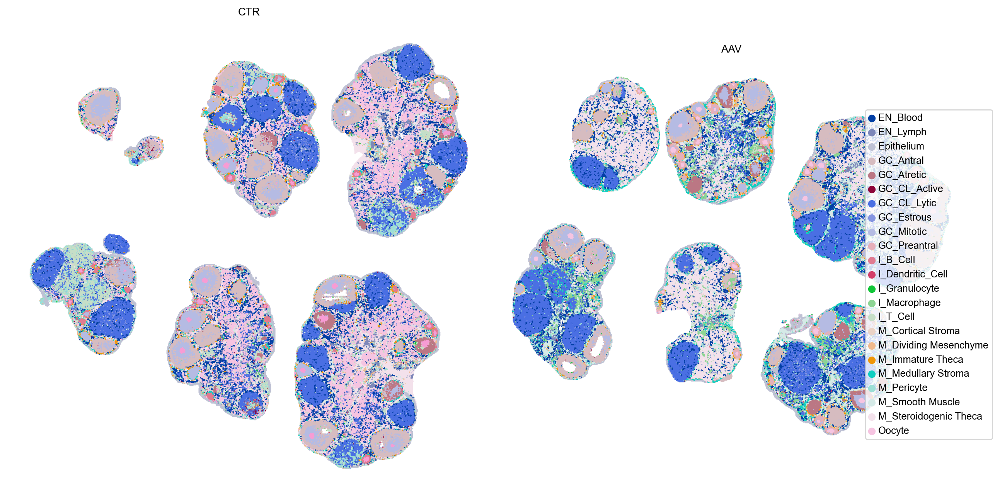

In [14]:
import scanpy as sc
import matplotlib.pyplot as plt

# 设置图形参数
sc.settings.set_figure_params(dpi=100, 
                              dpi_save=100, 
                              fontsize=10, 
                              facecolor='white', 
                              frameon=False, figsize=(2.0, 4.0), 
                              vector_friendly=False, transparent=True, format="pdf")
grouping_var = "Level1_max_pred_celltype"
fig, axs = plt.subplots(1, 2, figsize=(16, 8))  # 修改为一行两列布局

handles, labels = None, None  # 初始化图例变量

for i, sample in enumerate(samples_dict.keys()):
    subset = adata_vis[adata_vis.obs["Sample"] == sample]
    
    ax = axs[i]  # 修改为一维索引
    
    if i == 1:
        sc.pl.spatial(subset, color=[grouping_var], 
                      wspace=0.0, hspace=0.0, spot_size=30, 
                      frameon=False, title=sample, show=False, ax=ax, cmap="RdPu")
        handles, labels = ax.get_legend_handles_labels()
        legend = ax.get_legend()
        if legend:
            legend.remove()  # 如果存在图例，则将其移除
    else:
        sc.pl.spatial(subset, color=[grouping_var], wspace=0.0, hspace=0.0, spot_size=30, frameon=False, title=sample, show=False, legend_loc="none", ax=ax, cmap="RdPu")

# 仅在 handles 和 labels 不为 None 时添加全局图例
if handles and labels:
    fig.legend(handles, labels, loc='right', bbox_to_anchor=(0.98, 0.5))

plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

In [6]:
samples_dict = {"CTR": "CTR", "AAV": "AAV"}

In [15]:
adata_vis

AnnData object with n_obs × n_vars = 303411 × 16455
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'Sample', '_indices', '_scvi_batch', '_scvi_labels', 'total_abundance', 'EN_Blood', 'EN_Lymph', 'Epithelium', 'GC_Antral', 'GC_Atretic', 'GC_CL_Active', 'GC_CL_Lytic', 'GC_Estrous', 'GC_Mitotic', 'GC_Mural', 'GC_Preantral', 'I_B_Cell', 'I_Dendritic_Cell', 'I_Granulocyte', 'I_Macrophage', 'I_T_Cell', 'M_Cortical Stroma', 'M_Dividing Mesenchyme', 'M_Immature Theca', 'M_Medullary Stroma', 'M_Pericyte', 'M_Smooth Muscle', 'M_Steroidogenic Theca', 'Oocyte', 'Level1_max_pred', 'Level1_max_pred_celltype'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts-AAV', 'mean_counts-AAV', 'log1p_mean_counts-AAV', 'pct_dropout_by_counts-AAV', 'total_counts-AAV', 'log1p_total_counts-AA

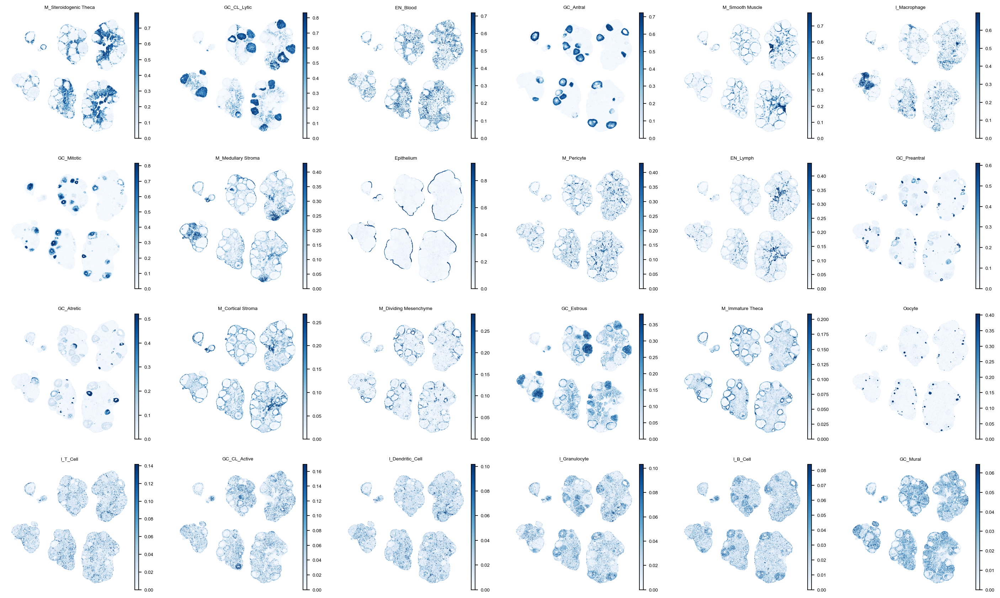

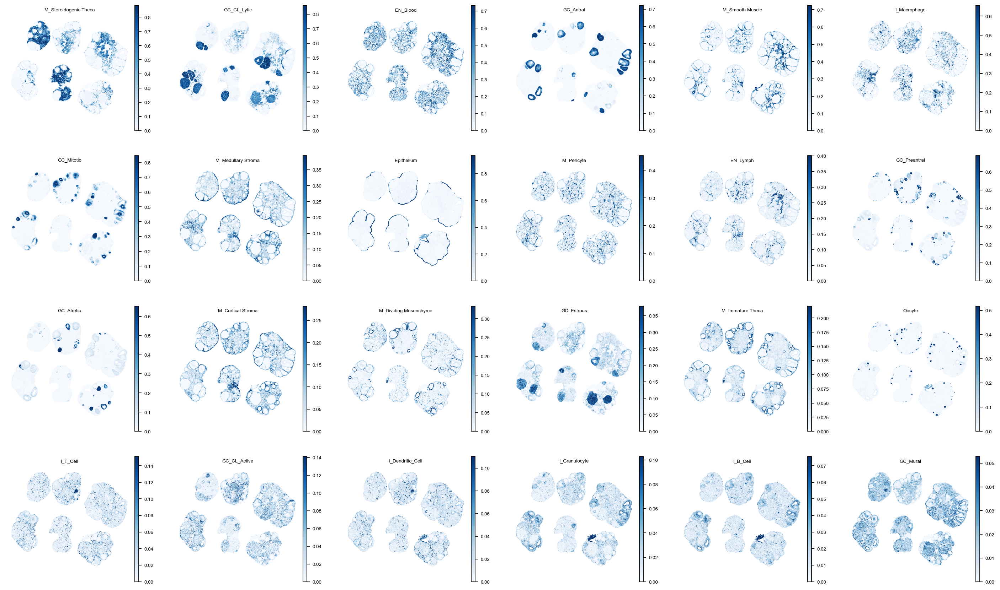

In [18]:
# plot in spatial coordinates
sc.settings.set_figure_params(dpi_save= 400, fontsize=6, figsize=(3.0, 3.0), facecolor='white', frameon=False, transparent=True, vector_friendly = True, format="pdf")
for sample in samples_dict.keys():    
    sc.pl.spatial(adata_vis[adata_vis.obs["Sample"] == sample], cmap="Blues",
                      # show first 8 cell types
                      color=list(adata_vis.obs["Level1_max_pred_celltype"].value_counts().index), spot_size= 30, 
                  ncols=6, wspace = 0.2, hspace=0.2,
                      # limit color scale at 99.2% quantile of cell abundance
                     vmin=0, vmax='p99.2', legend_fontsize=5)

In [16]:
# Compute expected expression per cell type
expected_dict = mod.module.model.compute_expected_per_cell_type(
    mod.samples["post_sample_q05"], mod.adata_manager  
)

# Add to anndata layers
for i, n in enumerate(mod.factor_names_):
    adata_vis.layers["Level1_" + n] = expected_dict['mu'][i]

In [17]:
# Save anndata object with results
adata_vis.write_h5ad("./pyobjs/slideseq_cell2loc_RCTD_level1.h5ad")

In [19]:
adata_vis = sc.read_h5ad("./pyobjs/slideseq_cell2loc_RCTD_level1.h5ad")
adata_vis

AnnData object with n_obs × n_vars = 303411 × 16455
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'Sample', '_indices', '_scvi_batch', '_scvi_labels', 'total_abundance', 'EN_Blood', 'EN_Lymph', 'Epithelium', 'GC_Antral', 'GC_Atretic', 'GC_CL_Active', 'GC_CL_Lytic', 'GC_Estrous', 'GC_Mitotic', 'GC_Mural', 'GC_Preantral', 'I_B_Cell', 'I_Dendritic_Cell', 'I_Granulocyte', 'I_Macrophage', 'I_T_Cell', 'M_Cortical Stroma', 'M_Dividing Mesenchyme', 'M_Immature Theca', 'M_Medullary Stroma', 'M_Pericyte', 'M_Smooth Muscle', 'M_Steroidogenic Theca', 'Oocyte', 'Level1_max_pred', 'Level1_max_pred_celltype'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts-AAV', 'mean_counts-AAV', 'log1p_mean_counts-AAV', 'pct_dropout_by_counts-AAV', 'total_counts-AAV', 'log1p_total_counts-AA

f:\anaconda\envs\scvi-env\lib\site-packages\scanpy\plotting\_utils.py:429: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


MemoryError: Unable to allocate 350. MiB for an array with shape (91704728,) and data type int32

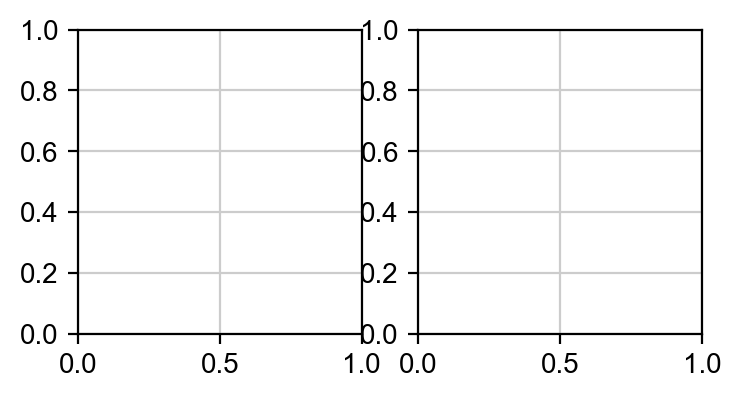

In [22]:
fig, axs = plt.subplots(1,2, figsize = (4,2))
for i, sample in enumerate(samples_dict.keys()):
    sc.settings.set_figure_params(dpi=100, dpi_save= 100, fontsize=10, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly = False, transparent=True, format="pdf")
    sc.pl.spatial(adata_vis[adata_vis.obs["Sample"] == sample], 
                  color = ["Level1_max_pred_celltype"], 
                  wspace= 1.0, 
                  spot_size = 30, 
                  frameon=False, title=sample, show=False, ax=axs[i])  